In [26]:
import os
import sys
sys.path.append(os.path.abspath(os.path.join('../scripts')))
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.express as px

In [27]:
import numpy as np
import pandas as pd
from helper import TelecomHelper
import plots
from clean_telecom_df import CleanTelecomData

pd.options.display.float_format = "{:.6f}".format

In [28]:
engagment_path = "../data/user_engagement.csv"
experience_path = "../data/user_experience_metrics.csv"

In [39]:
Helper = TelecomHelper()

user_engagement = Helper.read_csv(engagment_path)
user_experience = Helper.read_csv(experience_path)



file read as csv
file read as csv


In [40]:
user_engagement = user_engagement.rename(columns={'score': 'engagment_score'})
user_engagement.head()

,sessions_frequency,duration,total_traffic,clusters,enga_score,engagment_score,msisdn
0,1.000000,116720.000000,878690574.000000,2,532090434.027460,1187508034.903370,33601001722.000000
1,1.000000,181230.000000,156859643.000000,0,1253921354.366432,248329169.269407,33601001754.000000
2,1.000000,134969.000000,595966483.000000,0,814814518.758926,504019763.292543,33601002511.000000
3,1.000000,49878.000000,422320698.000000,2,988460314.457223,128363063.019269,33601007832.000000
4,2.000000,37104.000000,1457410944.000000,2,46630335.773752,2334064474.537566,33601008617.000000


In [43]:

user_experience = user_experience.rename(columns={'score': 'experience_score'})
user_experience.head()

,avg_rtt_ms,avg_throughput_kbps,tcp_retrans_bytes,clusters,experience_score,msisdn
0,46.000000,76.000000,21825280.436430,0,2749874775.790747,33601001722.000000
1,31.000000,99.000000,21825280.436430,0,2749874775.789351,33601001754.000000
2,123.593439,97.000000,21825280.436430,0,2749874775.789466,33601002511.000000
3,84.000000,248.000000,773968.274842,2,2770926087.903410,33601007832.000000
4,119.000000,56844.000000,31196112.436430,1,2740503940.935281,33601008617.000000


### Task 4.2

The average of both engagement & experience scores as  the satisfaction score

In [44]:
user_engagement

,sessions_frequency,duration,total_traffic,clusters,enga_score,engagment_score,msisdn
0,1.000000,116720.000000,878690574.000000,2,532090434.027460,1187508034.903370,33601001722.000000
1,1.000000,181230.000000,156859643.000000,0,1253921354.366432,248329169.269407,33601001754.000000
2,1.000000,134969.000000,595966483.000000,0,814814518.758926,504019763.292543,33601002511.000000
3,1.000000,49878.000000,422320698.000000,2,988460314.457223,128363063.019269,33601007832.000000
4,2.000000,37104.000000,1457410944.000000,2,46630335.773752,2334064474.537566,33601008617.000000
...,...,...,...,...,...,...,...
105714,1.000000,160461.000000,208123067.000000,0,1202657931.379292,192284797.946569,33789967113.000000
105715,2.000000,210389.000000,1094693386.000000,1,316087610.974151,1709868528.205170,33789980299.000000
105716,1.000000,8810.000000,714641641.000000,2,696139389.835040,789684256.648069,33789996170.000000
105717,1.000000,140988.000000,480307335.000000,0,930473665.528846,236001223.065851,33789997247.000000


In [51]:

satisfaction_metrics = pd.merge(user_engagement, user_experience, on="msisdn")
satisfaction_metrics['satisfaction_score'] = (satisfaction_metrics['engagment_score'] +
                                              satisfaction_metrics['experience_score']) / 2

score_df = satisfaction_metrics[['msisdn', 'engagment_score',
                                              'experience_score', 'satisfaction_score']]



,msisdn,engagment_score,experience_score,satisfaction_score
0,33601001722.000000,1187508034.903370,2749874775.790747,1968691405.347058
1,33601001754.000000,248329169.269407,2749874775.789351,1499101972.529379
2,33601002511.000000,504019763.292543,2749874775.789466,1626947269.541005
3,33601007832.000000,128363063.019269,2770926087.903410,1449644575.461339
4,33601008617.000000,2334064474.537566,2740503940.935281,2537284207.736423


Top 10 satisfied customer 

In [158]:
from sklearn.preprocessing import Normalizer, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression



def normalizer(df, columns):
    norm = Normalizer()
    return pd.DataFrame(norm.fit_transform(df), columns=columns)

def scaler(df, columns):
    minmax_scaler = MinMaxScaler()
    return pd.DataFrame(minmax_scaler.fit_transform(df), columns=columns)

def scale_and_normalize(df,columns ):
    return normalizer(scaler(df, columns), columns)

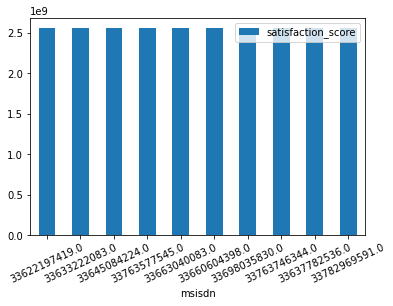

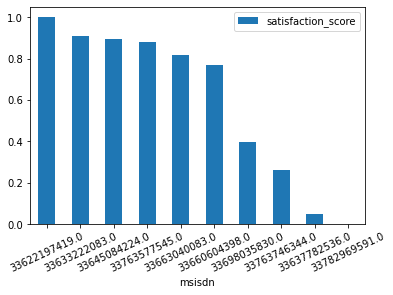

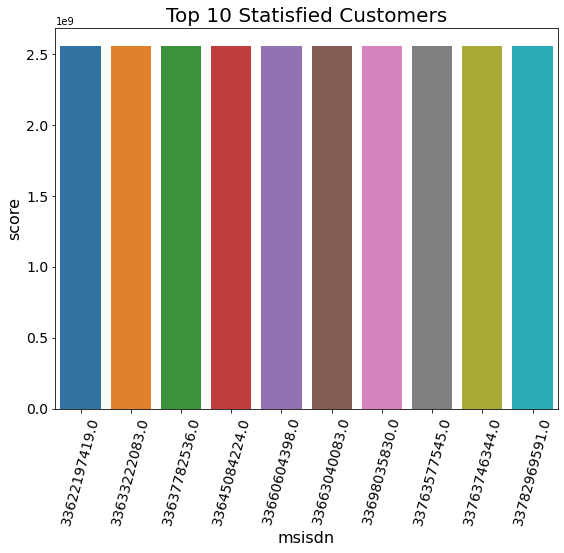

In [98]:

top_10_satisfied = score_df.sort_values(by=['satisfaction_score'], ascending=False).head(10)

scaled_top_score = scaler(top_10_satisfied[['satisfaction_score']], ['satisfaction_score'])
scaled_top_score['msisdn'] = top_10_satisfied['msisdn'].to_list()

top_10_satisfied.plot(kind="bar", x='msisdn', y='satisfaction_score', rot=25)

scaled_top_score.plot(kind="bar", x='msisdn', y='satisfaction_score', rot=25)

plots.plot_bar(top_10_satisfied, 'msisdn', 'satisfaction_score', 'Top 10 Statisfied Customers', 'msisdn', 'score')

# scaled_top_score


### Task 4.3


Build a regression model that predicts satisfaction_score given engagment_score and experience_score

In [185]:


X = score_df[['engagment_score', 'experience_score']]
y = score_df[['satisfaction_score']]

linear_reg = LinearRegression()

x = linear_reg.fit(X, y)
pred = linear_reg.predict(X)



### Task 4.4

Run a k-means (k=2) on the engagement & the experience score . 


#### First let's detect outliers

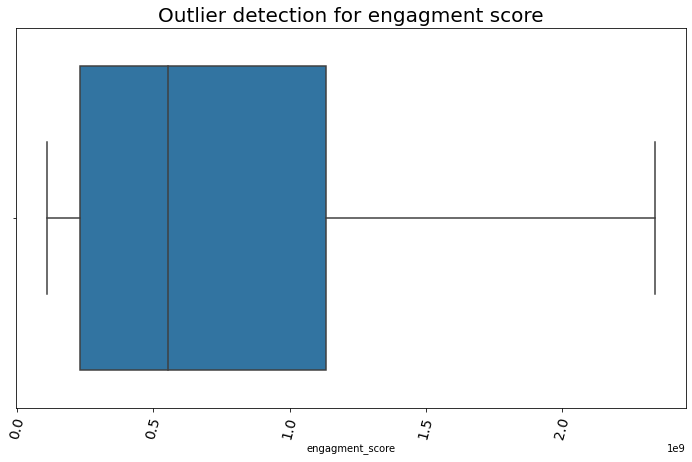

In [103]:
plots.plot_box(df=score_df, x_col="engagment_score", title="Outlier detection for engagment score")

We can see that engagment socre doese not have siginificant outlier

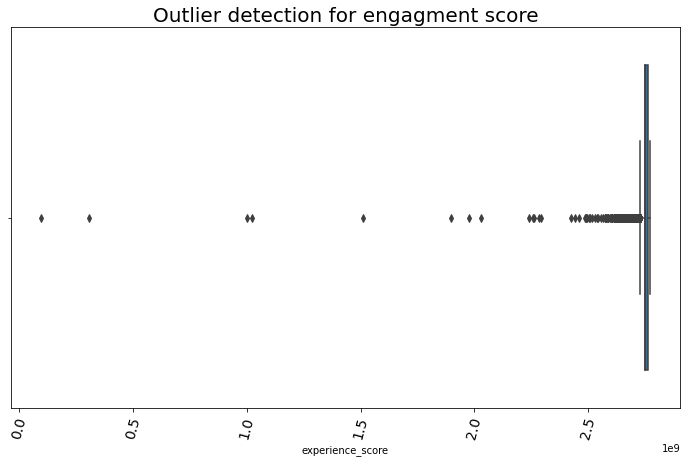

In [104]:
plots.plot_box(df=score_df, x_col="experience_score", title="Outlier detection for engagment score")

experience_score has significant outliers so we need to handle that

In [108]:
def handle_outliers(df, col, method="lower_upper"):
    df = df.copy()
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    
    lower_bound = q1 - ((1.5) * (q3 - q1))
    upper_bound = q3 + ((1.5) * (q3 - q1))
    
    if method == "mean":
        df[col] = np.where(df[col] < lower_bound,   df[col].mean(), df[col])
        df[col] = np.where(df[col] > upper_bound, df[col].mean(), df[col])
    
    elif  method == "mode":
        df[col] = np.where(df[col] < lower_bound,   df[col].mode()[0], df[col])
        df[col] = np.where(df[col] > upper_bound, df[col].mode()[0], df[col])
    else:
        df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
        df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])
    
    return df

In [123]:
score_df_2 = score_df.copy()[['engagment_score', 'experience_score']]

cleaned_score_df_df = handle_outliers(score_df_2, 'experience_score', method="lower_upper")

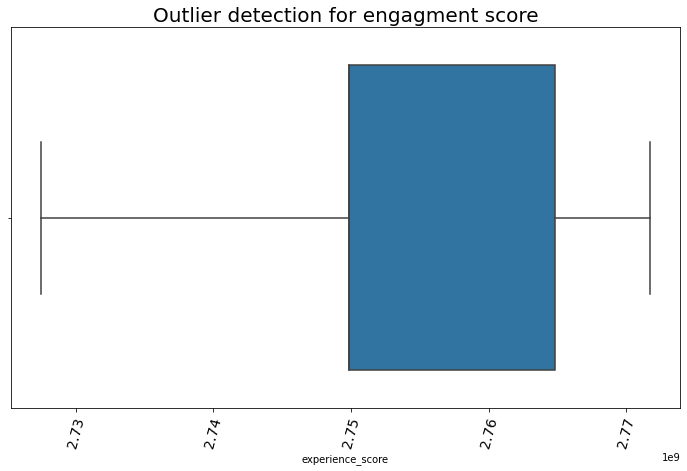

In [124]:

plots.plot_box(df=cleaned_score_df_df, x_col="experience_score", title="Outlier detection for engagment score")



Normaliztion of cloumns

In [125]:
def normalizer(df, columns):
    norm = Normalizer()
    return pd.DataFrame(norm.fit_transform(df), columns=columns)

def scaler(df, columns):
    minmax_scaler = MinMaxScaler()
    return pd.DataFrame(minmax_scaler.fit_transform(df), columns=columns)

def scale_and_normalize(df,columns ):
    return normalizer(scaler(df, columns), columns)

In [130]:
normalized_data = scale_and_normalize(cleaned_score_df_df, ['engagment_score', 'experience_score'])
normalized_data.describe()

,engagment_score,experience_score
count,105719.000000,105719.000000
mean,0.407042,0.782325
std,0.342008,0.324527
min,0.000000,0.000000
25%,0.092019,0.730879
50%,0.316050,0.948743
75%,0.682507,0.995757
max,1.000000,1.000000


Clustering engagement & the experience score using k=2

In [134]:
kmeans = KMeans(n_clusters=2, init='k-means++').fit(normalized_data)
pred = kmeans.predict(normalized_data)

culstered_score_df = score_df.copy()
culstered_score_df['clusters'] = pred
culstered_score_df['clusters'].value_counts()

1    78937
0    26782
Name: clusters, dtype: int64

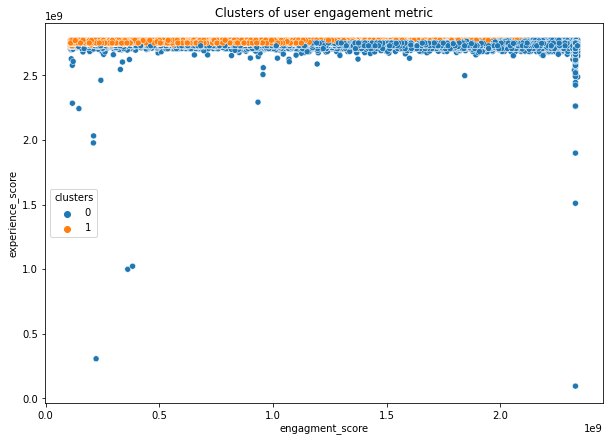

In [157]:
plt.figure(figsize=(10,7))


p = sns.scatterplot(x = 'engagment_score', y='experience_score',
                hue='clusters', data=culstered_score_df).set_title('Clusters of user engagement metric')

# plt.show()

In [193]:
fig = px.scatter(culstered_score_df, x='engagment_score', y="experience_score",
                 color='clusters', size='experience_score')
fig.show()

***Aggregate the average satisfaction & experience score per cluster***

In [191]:

cluster_avg_scores =  culstered_score_df.groupby('clusters').agg({'engagment_score':'mean', 'experience_score':'mean',
                                           'satisfaction_score':'mean'})
cluster_avg_scores

,engagment_score,experience_score,satisfaction_score
clusters,,,
0,1713001021.572171,2734324284.762500,2223662653.167278
1,483389510.542236,2756749955.047919,1620069732.795765


In [ ]:

fig = px.scatter(experiance_metric_df, x='total_avg_rtt', y="total_avg_tp",
                 color='cluster', size='total_avg_tcp')
fig.show()